In [5]:
import sys
import os
import glob
import pickle
from time import time
from time import strftime
import random
import itertools
import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)
from collections import OrderedDict
from importlib import reload

import numpy as np
import pandas as pd
import scipy.io as sio
import scipy.stats as stats
from scipy.interpolate import interp1d
from scipy.ndimage.filters import gaussian_filter
import scipy.signal as signal
import statsmodels.api as sm
 
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150
colors = ['1f77b4', 'd62728', '2ca02c', 'ff7f0e', '9467bd', 
          '8c564b', 'e377c2', '7f7f7f', 'bcbd22', '17becf']
mpl.rcParams['axes.prop_cycle'] = mpl.cycler('color', colors)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.formatter.offset_threshold'] = 2
mpl.rcParams['xtick.labelsize'] = 'small'
mpl.rcParams['ytick.labelsize'] = 'small'
mpl.rcParams['axes.labelsize'] = 'small'
mpl.rcParams['axes.titlesize'] = 'small'
mpl.rcParams['legend.fontsize'] = 'small'
mpl.rcParams['figure.titlesize'] = 'small'
mpl.rcParams['axes.grid'] = True
mpl.rcParams['axes.axisbelow'] = True
mpl.rcParams['grid.linewidth'] = 0.1
mpl.rcParams['grid.alpha'] = 0.75
mpl.rcParams['legend.frameon'] = False
mpl.rcParams['lines.linewidth'] = 0.8 

import mne
import neurodsp
from ptsa.data.TimeSeriesX import TimeSeries

sys.path.append('/home1/dscho/code/general')
sys.path.append('/home1/dscho/code/projects/manning_replication')
sys.path.append('/home1/dscho/code/projects/unit_activity_and_hpc_theta')
import data_io as dio
import array_operations as aop
import spectral_processing as spp
import manning_utils
import manning_analysis
import phase_locking
from eeg_plotting import plot_trace, plot_trace2

In [2]:
def load_session_dat(subj_df, subj_sess):
    """Return subj_df, processed LFP, and spikes."""
    subj_df_ = subj_df.loc[subj_df.subj_sess==subj_sess]
    lfp = TimeSeries.from_hdf(subj_df_.proc_lfp_file.tolist()[0])
    with open(subj_df_.session_spikes_file.tolist()[0], 'rb') as f:
        spikes = pickle.load(f)
    return subj_df_, lfp, spikes

In [3]:
## Setup project.
dirs, subj_info, config, subj_df, subj_df_file = manning_analysis.setup_session()
data_dir = dirs['data']
epoch_dir = os.path.join(data_dir, 'epoch')
figure_dir = dirs['figs']
sessions = subj_df.groupby('subj_sess').mean().index.tolist()

# Figure out which subjects have dataframes in metadata.
files = glob.glob(os.path.join(data_dir, 'metadata', 'subj_df_*.xlsx'))
sessions = []
for f in sorted(files):
    subj_sess = os.path.basename(f)[8:os.path.basename(f).index('.xlsx')]
    sessions.append(subj_sess)
print('{} sessions'.format(len(sessions)))

subj_df = pd.read_excel(files[0], converters={'chan': str})
for f in files[1:]:
    subj_df = subj_df.append(pd.read_excel(f, converters={'chan': str}))
subj_df = subj_df.loc[subj_df.location!='none']

# Get a dictionary of all channels with 1+ units.
spike_chans = OrderedDict(subj_df.loc[subj_df.n_clusters>0][['subj_sess', 'chan']].groupby('subj_sess').chan.apply(list))

Loading subjects DataFrame: /data3/scratch/dscho/frLfp/data/subj_df.xlsx

There are 20 subjects, 46 sessions, and 2944 channels in the study.

46 sessions will be processed: ['U367_env2', 'U369_env1', 'U369_env2', 'U370_env1', 'U371_env1', 'U371_env2', 'U371_env3', 'U372_ses1', 'U372_ses2', 'U373_ses1', 'U373_ses2', 'U373_ses3', 'U374_ses1', 'U374_ses2', 'U379_ses1', 'U380_ses1a', 'U380_ses2', 'U380_ses3', 'U381_ses1', 'U381_ses2', 'U381_ses3', 'U384_ses1', 'U384_ses2', 'U384_ses3', 'U385_ses1', 'U385_ses2', 'U385_ses3', 'U385_ses4', 'U386_ses1', 'U386_ses2', 'U387_ses1', 'U387_ses2', 'U387_ses3', 'U390_ses1', 'U390_ses2', 'U390_ses3', 'U390_ses4', 'U392_ses1', 'U393_ses2', 'U394_ses1', 'U394_ses3', 'U395_ses1', 'U395_ses2', 'U395_ses3', 'U396_ses2', 'U396_ses3']
0 sessions have missing input files and will not be processed.

46 sessions


In [4]:
dirs, subj_info, config, subj_df, subj_df_file = manning_analysis.setup_session()

Loading subjects DataFrame: /data3/scratch/dscho/frLfp/data/subj_df.xlsx

There are 20 subjects, 46 sessions, and 2944 channels in the study.

46 sessions will be processed: ['U367_env2', 'U369_env1', 'U369_env2', 'U370_env1', 'U371_env1', 'U371_env2', 'U371_env3', 'U372_ses1', 'U372_ses2', 'U373_ses1', 'U373_ses2', 'U373_ses3', 'U374_ses1', 'U374_ses2', 'U379_ses1', 'U380_ses1a', 'U380_ses2', 'U380_ses3', 'U381_ses1', 'U381_ses2', 'U381_ses3', 'U384_ses1', 'U384_ses2', 'U384_ses3', 'U385_ses1', 'U385_ses2', 'U385_ses3', 'U385_ses4', 'U386_ses1', 'U386_ses2', 'U387_ses1', 'U387_ses2', 'U387_ses3', 'U390_ses1', 'U390_ses2', 'U390_ses3', 'U390_ses4', 'U392_ses1', 'U393_ses2', 'U394_ses1', 'U394_ses3', 'U395_ses1', 'U395_ses2', 'U395_ses3', 'U396_ses2', 'U396_ses3']
0 sessions have missing input files and will not be processed.



In [56]:
# Process spikes, LFP manually
start = time()
subj_df_, lfp_raw, lfp_proc, session_spikes, fr_df, clus_to_chan, chan_to_clus = manning_analysis.preprocess_session(
    subj_sess=sessions[0], 
    subj_df=subj_df, 
    subj_df_file='/data3/scratch/dscho/frLfp/data/subj_df.xlsx', 
    overwrite=True)
print('Done in {:.0f} secs'.format(time() - start))

Done in 127 secs


In [8]:
# Within each session, get the stdev of raw LFP values across time, for each channel.
# Find channels where this value is > the 3rd quartile + 2.5*IQR relative to stdevs
# across channels in the session, or is < the 1st quartile - 2.5*IQR (Tukey's method).
# Apply the same method with stdev(abs(diff(raw LFP))) - i.e. the first order derivative.
start = time()
bad_chans = OrderedDict()
beta = 2.5
stdevs_stds = []
stdevs_diffs = []
outlier_cutoff_stds = []
outlier_cutoff_diffs = []
for i, subj_sess in enumerate(sessions):
    lfp = TimeSeries.from_hdf(os.path.join(data_dir, 'lfp', '{}_raw.hdf'.format(subj_sess)))
    #lfp.channel.data = [str(chan) for chan in lfp.channel.data]
    chans = lfp.channel.data
    stdevs_std = lfp.std(dim='time').data
    stdevs_stds.append(stdevs_std)
    stdevs_diff = np.abs(lfp.diff(dim='time')).std(dim='time').data
    stdevs_diffs.append(stdevs_diff)
    iqr_std = stats.iqr(stdevs_std)
    iqr_diff = stats.iqr(stdevs_diff)
    outlier_cutoff_std = (np.percentile(stdevs_std, 25) - (beta * iqr_std),
                          np.percentile(stdevs_std, 75) + (beta * iqr_std))
    outlier_cutoff_stds.append(outlier_cutoff_std)
    outlier_cutoff_diff = (np.percentile(stdevs_diff, 25) - (beta * iqr_diff),
                           np.percentile(stdevs_diff, 75) + (beta * iqr_diff))
    outlier_cutoff_diffs.append(outlier_cutoff_diff)
    bad_chans_std = list(chans[np.any((stdevs_std<outlier_cutoff_std[0], stdevs_std>outlier_cutoff_std[1]), axis=0)])
    bad_chans_diff = list(chans[np.any((stdevs_diff<outlier_cutoff_diff[0], stdevs_diff>outlier_cutoff_diff[1]), axis=0)])
    bad_chans[subj_sess] = {'good': [chan for chan in chans if chan not in (bad_chans_std + bad_chans_diff)],
                            'bad_std': [chan for chan in bad_chans_std if chan not in bad_chans_diff],
                            'bad_diff': [chan for chan in bad_chans_diff if chan not in bad_chans_std],
                            'bad_both': [chan for chan in bad_chans_diff if chan in bad_chans_std]}

bad_chans['info'] = 'cutoff = 1st quartile - ({} * IQR) or 3rd quartile + ({} * IQR)'.format(beta, beta)
                     
if True:
    fname = os.path.join(data_dir, 'other', 'bad_chans_auto_detection.pkl')
    with open(fname, 'wb') as f:
        pickle.dump(bad_chans, f, pickle.HIGHEST_PROTOCOL)
    print('Saved bad_chans as {}'.format(fname))
print('Done in {:.0f} secs'.format(time() - start))

Done in 232 secs


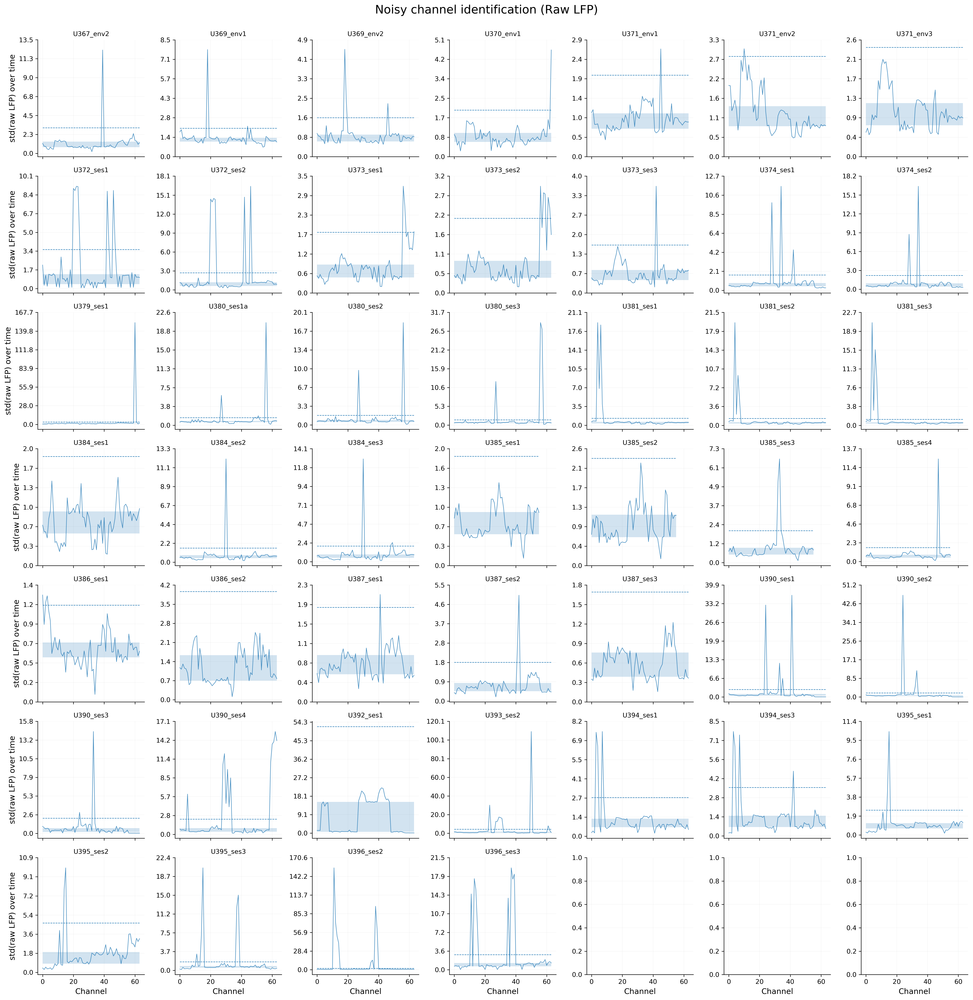

In [9]:
# Plot noisy channel identification for all sessions in the study.
fig, ax = plt.subplots(7, 7, sharex=True, figsize=(21, 21), dpi=300)
ax = np.ravel(ax)

for i, subj_sess in enumerate(sessions):
    ax[i].plot(stdevs_stds[i], color='C0', alpha=0.8)
    ax[i].fill_between(range(len(stdevs_stds[i])), np.percentile(stdevs_stds[i], 25), np.percentile(stdevs_stds[i], 75),
                       color='C0', alpha=0.2, linewidth=0)
    ax[i].plot(np.repeat(outlier_cutoff_stds[i][1], len(stdevs_stds[i])), color='C0', linewidth=0.75, linestyle='--')

    if i in (0, 7, 14, 21, 28, 35, 42):
        ax[i].set_ylabel('std(raw LFP) over time', fontsize=12)
    pad = 0.1 * (max(stdevs_stds[i]) - min(stdevs_stds[i]))
    ytickvals = np.linspace(0, max(outlier_cutoff_stds[i][1], max(stdevs_stds[i])) + pad, 7)
    ax[i].set_yticks(ytickvals)
    ax[i].set_yticklabels([round(val*1e4, 1) for val in ytickvals])
    ax[i].set_title(subj_sess)

for i in range(42, len(ax)):
    ax[i].set_xlabel('Channel', fontsize=12)

fig.tight_layout()
fig.suptitle('Noisy channel identification (Raw LFP)', fontsize=18, y=1.02)
f = os.path.join(figure_dir, 'bad_channel_identification_stdev_rawLFP.png')
#fig.savefig(f)

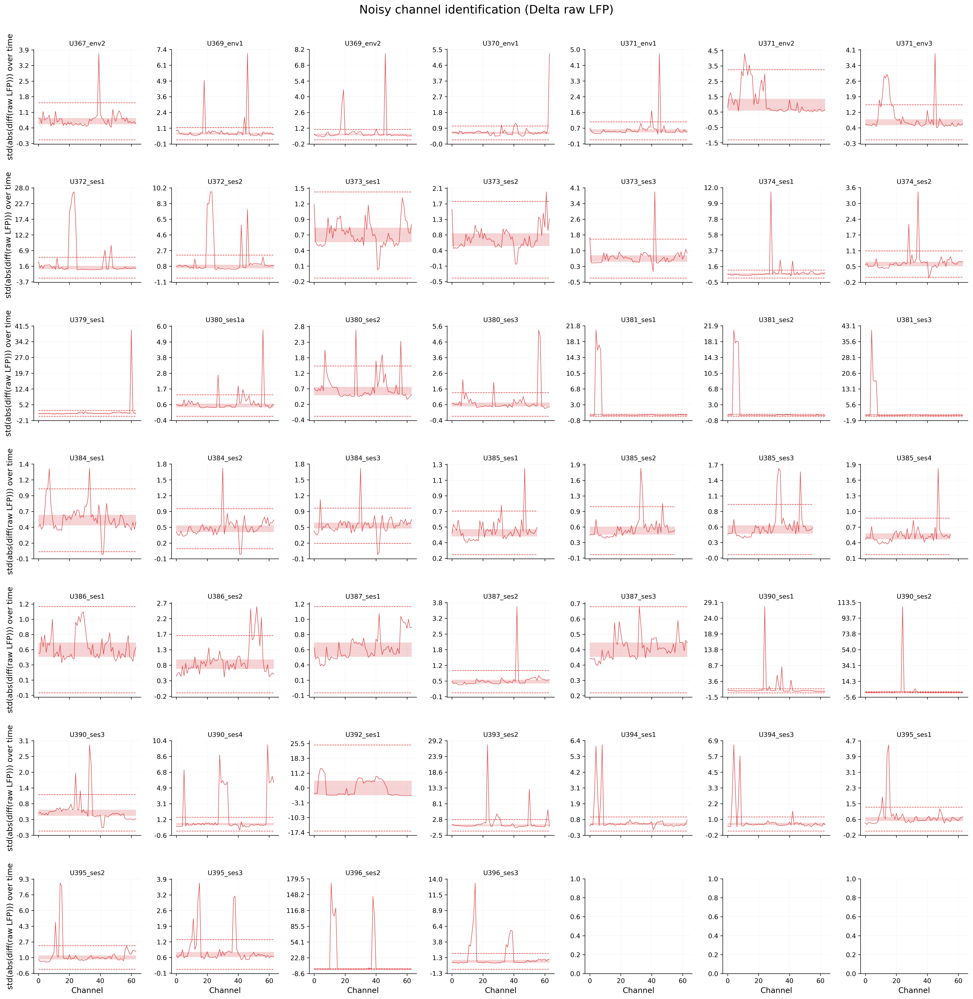

In [10]:
# Plot noisy channel identification for all sessions in the study.
fig, ax = plt.subplots(7, 7, sharex=True, figsize=(21, 21), dpi=300)
ax = np.ravel(ax)

for i, subj_sess in enumerate(sessions):    
    ax[i].plot(stdevs_diffs[i], color='C1', alpha=0.8)
    ax[i].fill_between(range(len(stdevs_diffs[i])), np.percentile(stdevs_diffs[i], 25), np.percentile(stdevs_diffs[i], 75),
                       color='C1', alpha=0.2, linewidth=0)
    ax[i].plot(np.repeat(outlier_cutoff_diffs[i][0], len(stdevs_diffs[i])), color='C1', linewidth=0.75, linestyle='--')
    ax[i].plot(np.repeat(outlier_cutoff_diffs[i][1], len(stdevs_diffs[i])), color='C1', linewidth=0.75, linestyle='--')
    
    if i in (0, 7, 14, 21, 28, 35, 42):
        ax[i].set_ylabel('std(abs(diff(raw LFP))) over time', fontsize=12)
    pad = 0.05 * (max(stdevs_diffs[i]) - min(stdevs_diffs[i]))
    ytickvals = np.linspace(min(outlier_cutoff_diffs[i][0], min(stdevs_diffs[i])) - pad, 
                            max(outlier_cutoff_diffs[i][1], max(stdevs_diffs[i])) + pad, 7)
    ax[i].set_yticks(ytickvals)
    ax[i].set_yticklabels([round(val*1e5, 1) for val in ytickvals])
    ax[i].set_title(subj_sess)

for i in range(42, len(ax)):
    ax[i].set_xlabel('Channel', fontsize=12)
    
fig.tight_layout()
fig.suptitle('Noisy channel identification (Delta raw LFP)', fontsize=18, y=1.02)
f = os.path.join(figure_dir, 'bad_channel_identification_stdev_delta_rawLFP.png')
#fig.savefig(f)

In [11]:
# REMOVE!!
bad_chans_manual = OrderedDict()
bad_chans_manual['U373_ses1'] = ['42', '43'] # bad
bad_chans_manual['U373_ses2'] = ['42', '43'] # bad
bad_chans_manual['U373_ses3'] = ['42', '43'] # bad
bad_chans_manual['U374_ses2'] = ['42', '43'] # bad
bad_chans_manual['U390_ses1'] = ['42', '43'] # bad
bad_chans_manual['U390_ses2'] = ['42', '43'] # good
bad_chans_manual['U390_ses3'] = ['42', '43'] # bad
bad_chans_manual['U394_ses1'] = ['42', '43'] # bad
if True:
    fname = os.path.join(data_dir, 'other', 'bad_chans_manual.pkl')
    with open(fname, 'wb') as f:
        pickle.dump(bad_chans_manual, f, pickle.HIGHEST_PROTOCOL)
    print('Saved bad_chans_manual as {}'.format(fname))

Saved bad_chans_manual as /data3/scratch/dscho/frLfp/data/other/bad_chans_manual.pkl


In [6]:
# Get session info.
subj_df = phase_locking.get_subj_df()

In [7]:
lfp_raw, lfp = manning_analysis.process_lfp(sessions[0], 
                                            subj_df=subj_df, 
                                            notch_freqs=[60, 120],
                                            interpolate=False)

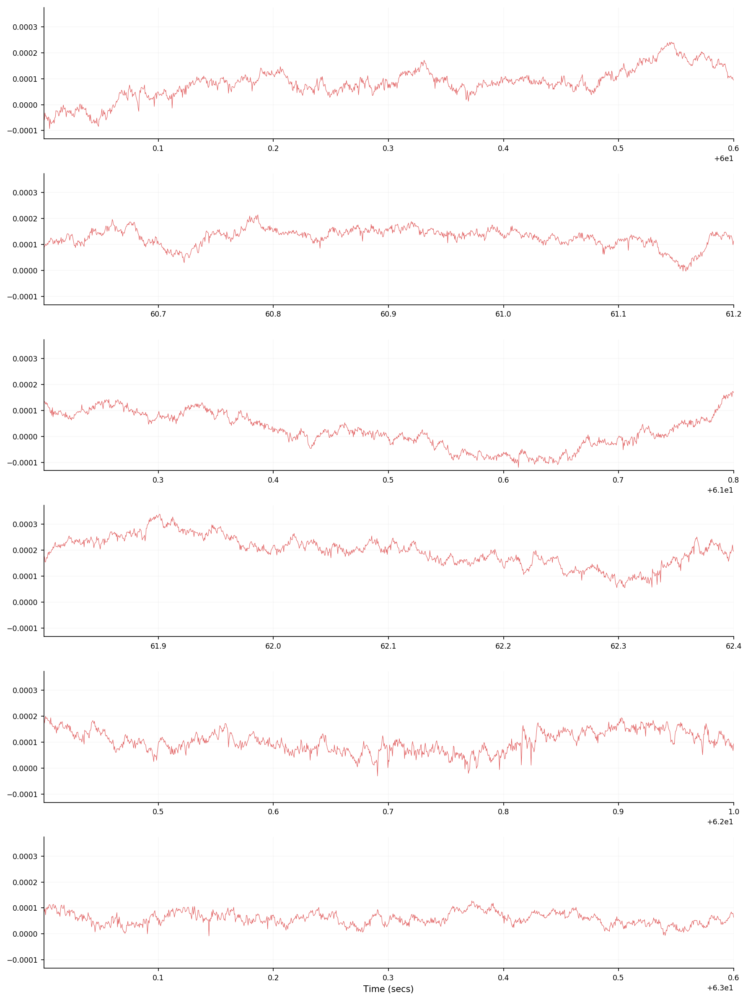

In [16]:
ch = '1'
fig, ax = plot_trace2(lfp.sel(channel=[ch]), start=60, duration=3.6, nwin=6, same_yaxis=True, 
                      linewidths=[0.5], alphas=[0.8], colors=['C1'], dpi=150)

In [ ]:
# Save a pdf file for each session, with raw channel LFPs shown at two timescales.
start_time = time()
for subj_sess in sessions[5:]:
    pdf = PdfPages(os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/figs/chan_inspection',
                                '{}_microLFP_notch60-120_channel_inspection.pdf'.format(subj_sess)))
    lfp_raw, lfp = manning_analysis.process_lfp(subj_sess, 
                                                subj_df=subj_df, 
                                                notch_freqs=[60, 120],
                                                interpolate=False)
    for ch in lfp.channel.data:
        # Plot the channel LFP for 3.6 secs. 
        fig, ax = plot_trace2(lfp.sel(channel=[ch]), start=60, duration=3.6, nwin=6, same_yaxis=True, 
                              linewidths=[0.5], alphas=[0.8], colors=['C1'], dpi=150)
        ax[0].set_title('{} | ch{} | 3.6 secs'.format(subj_sess, ch), fontsize=18)
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])
        pdf.savefig(fig)
        plt.close('all')
        
        # Plot the channel LFP for 36 secs. 
        fig, ax = plot_trace2(lfp.sel(channel=[ch]), start=60, duration=36, nwin=6, same_yaxis=True, 
                              linewidths=[0.2], alphas=[0.8], colors=['C3'], dpi=150)
        ax[0].set_title('{} | ch{} | 36 secs'.format(subj_sess, ch), fontsize=18)
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])
        pdf.savefig(fig)
        plt.close('all')
        
        # Plot the channel LFP for 360 secs. 
        fig, ax = plot_trace2(lfp.sel(channel=[ch]), start=60, duration=360, nwin=6, same_yaxis=True, 
                              linewidths=[0.1], alphas=[0.8], colors=['C2'], dpi=150)
        ax[0].set_title('{} | ch{} | 360 secs'.format(subj_sess, ch), fontsize=18)
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])
        pdf.savefig(fig)
        plt.close('all')
        
        # Plot the channel LFP for the whole session. 
        fig, ax = plot_trace2(lfp.sel(channel=[ch]), nwin=6, same_yaxis=True, 
                              linewidths=[0.08], alphas=[0.8], colors=['C0'], dpi=150)
        ax[0].set_title('{} | ch{} | whole session'.format(subj_sess, ch), fontsize=18)
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])
        pdf.savefig(fig)
        plt.close('all')
        
        # Plot the channel PSD.
        freq_means, P_means = neurodsp.spectral.psd(lfp.sel(channel=ch), Fs=2000)
        fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=150)
        ax = np.ravel(ax)
        ax[0].plot(np.log10(freq_means[1:201]), np.log10(P_means[1:201]), color='C7', linewidth=1.5)
        ax[0].set_xticks(np.linspace(np.log10(1), np.log10(200), 10))
        ax[0].set_xticklabels([int(round(10**x, 0)) for x in np.linspace(np.log10(1), np.log10(200), 10)])
        ax[0].set_xlabel('Frequency (Hz)', fontsize=14)
        ax[0].set_ylabel('log10(Power)', fontsize=14)
        ax[0].tick_params(axis='both', labelsize=12)
        ax[0].set_title('{} | ch{} PSD'.format(subj_sess, ch), fontsize=18)
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])
        pdf.savefig(fig)
        plt.close('all')
    pdf.close()
    
print('Done in {:.0f} secs'.format(time() - start_time))

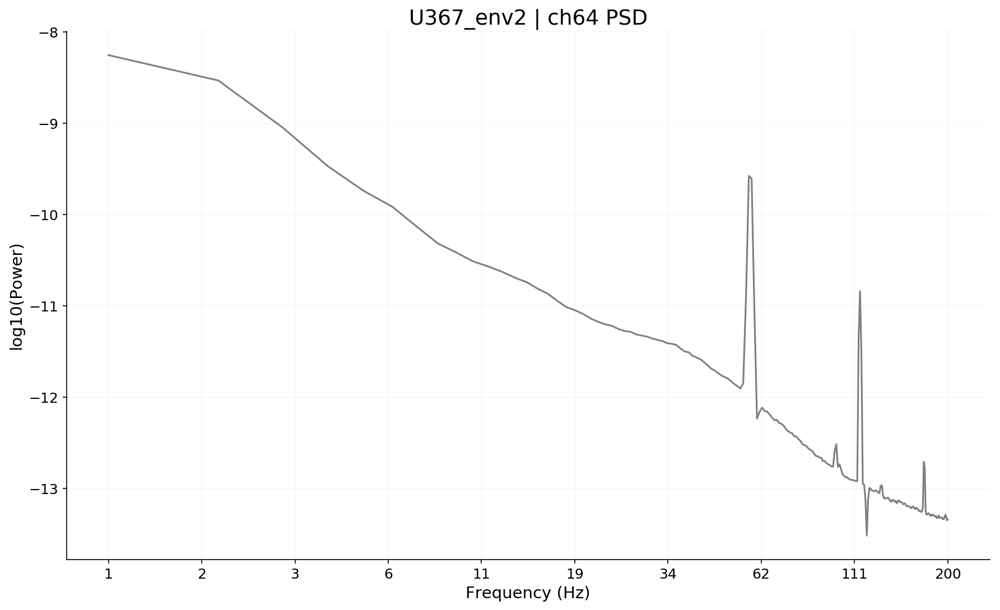

In [48]:
freq_means, P_means = neurodsp.spectral.psd(lfp.sel(channel=ch), Fs=2000)

fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=150)
ax = np.ravel(ax)

ax[0].plot(np.log10(freq_means[1:201]), np.log10(P_means[1:201]), color='C7', linewidth=1.5)
ax[0].set_xticks(np.linspace(np.log10(1), np.log10(200), 10))
ax[0].set_xticklabels([int(round(10**x, 0)) for x in np.linspace(np.log10(1), np.log10(200), 10)])
ax[0].set_xlabel('Frequency (Hz)', fontsize=14)
ax[0].set_ylabel('log10(Power)', fontsize=14)
ax[0].set_title('{} | ch{} PSD'.format(subj_sess, ch), fontsize=18)
ax[0].tick_params(axis='both', labelsize=12)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

['47', '19', '45']


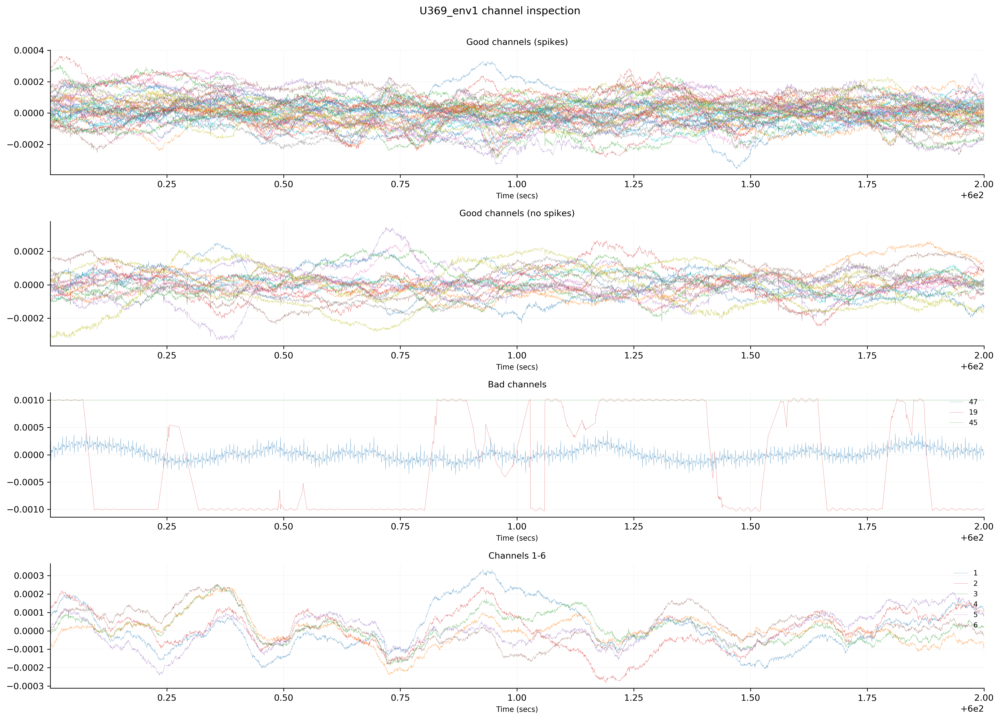

In [78]:
subj_sess = 'U396_ses3'
subj_df_, lfp, spikes = load_session_dat(subj_df, subj_sess)
chans = bad_chans[subj_sess]['bad_std'] + bad_chans[subj_sess]['bad_diff'] + bad_chans[subj_sess]['bad_both']
print(chans)

alpha = 0.85
linewidth=0.2

#start = np.random.randint(0, int(0.9 * (len(lfp.time)/2000.)))
fig, ax = plt.subplots(4, 1, figsize=(16, 12), dpi=300)
ax = np.ravel(ax)

chans_ = [chan for chan in spike_chans[subj_sess] if chan not in chans]
plot_trace(lfp.sel(channel=chans_), #legend_labels=chans_,
           linewidths=[linewidth]*len(chans_), alphas=[alpha]*len(chans_),
           start=600, duration=2, x_units='secs', ax=ax[0], title='Good channels (spikes)')

chans_ = [chan for chan in lfp.channel.data if (chan not in spike_chans[subj_sess]) and (chan not in chans)]
plot_trace(lfp.sel(channel=chans_), #legend_labels=chans_,
           linewidths=[linewidth]*len(chans_), alphas=[alpha]*len(chans_),
           start=600, duration=2, x_units='secs', ax=ax[1], title='Good channels (no spikes)')

chans_ = chans
plot_trace(lfp.sel(channel=chans_), legend_labels=chans_,
           linewidths=[linewidth]*len(chans_), alphas=[alpha]*len(chans_),
           start=600, duration=2, x_units='secs', ax=ax[2], title='Bad channels')

chans_ = ['42', '43']
chans_ = ['1', '2', '3', '4', '5', '6']
plot_trace(lfp.sel(channel=chans_), legend_labels=chans_,
           linewidths=[linewidth]*len(chans_), alphas=[alpha]*len(chans_),
           start=600, duration=2, x_units='secs', ax=ax[3], title='Channels 1-6')

fig.suptitle('{} channel inspection'.format(subj_sess), y=0.98, fontsize=12)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
f = os.path.join(figure_dir, 'channel_inspection_{}.png'.format(subj_sess))
fig.savefig(f)

In [12]:
# How many bad channels did we identify?
n_good_total = 0
n_bad_total = 0
for subj_sess, d in bad_chans.items():
    if subj_sess == 'info':
        continue
    n_good = len(d['good'])
    n_bad = len(d['bad_std'] + d['bad_diff'] + d['bad_both'])
    pct_bad = 100 * (n_bad / float(n_bad + n_good))
    n_good_total += n_good
    n_bad_total += n_bad
    print('{}: {} good, {} bad, {:.0f}% bad'.format(subj_sess, n_good, n_bad, pct_bad))
pct_bad_total = 100 * (n_bad_total / float(n_bad_total + n_good_total))
print('\n{} good, {} bad, {:.0f}% bad'.format(n_good_total, n_bad_total, pct_bad_total))

U367_env2: 63 good, 1 bad, 2% bad
U369_env1: 61 good, 3 bad, 5% bad
U369_env2: 60 good, 4 bad, 6% bad
U370_env1: 59 good, 5 bad, 8% bad
U371_env1: 62 good, 2 bad, 3% bad
U371_env2: 60 good, 4 bad, 6% bad
U371_env3: 56 good, 8 bad, 12% bad
U372_ses1: 55 good, 9 bad, 14% bad
U372_ses2: 57 good, 7 bad, 11% bad
U373_ses1: 61 good, 3 bad, 5% bad
U373_ses2: 59 good, 5 bad, 8% bad
U373_ses3: 62 good, 2 bad, 3% bad
U374_ses1: 61 good, 3 bad, 5% bad
U374_ses2: 61 good, 3 bad, 5% bad
U379_ses1: 62 good, 2 bad, 3% bad
U380_ses1a: 58 good, 6 bad, 9% bad
U380_ses2: 58 good, 6 bad, 9% bad
U380_ses3: 60 good, 4 bad, 6% bad
U381_ses1: 60 good, 4 bad, 6% bad
U381_ses2: 60 good, 4 bad, 6% bad
U381_ses3: 59 good, 5 bad, 8% bad
U384_ses1: 59 good, 5 bad, 8% bad
U384_ses2: 61 good, 3 bad, 5% bad
U384_ses3: 58 good, 6 bad, 9% bad
U385_ses1: 54 good, 2 bad, 4% bad
U385_ses2: 53 good, 3 bad, 5% bad
U385_ses3: 52 good, 4 bad, 7% bad
U385_ses4: 55 good, 1 bad, 2% bad
U386_ses1: 61 good, 3 bad, 5% bad
U386_ses2:

In [13]:
# keep_chans will include all channels in the study, indexed by
# keep_chans[subj_sess][roi], that met the following criteria:
# 1) were not identified as bad channels by the auto-detection method
# 2) were not identified as bad channels by manual detection
# 3) met region-level criteria for inclusion (4+ good channels in the
#    region and 2+ channels with units)

# Get all the channels from subj_df and group by subj_sess, region.
n_rois = 0
n_chans = 0
keep_chans = OrderedDict()
for subj_sess in sessions:
    keep_chans[subj_sess] = OrderedDict(subj_df.loc[subj_df.subj_sess==subj_sess].groupby('location').chan.apply(list))
    n_chans += len(subj_df.loc[subj_df.subj_sess==subj_sess])
    n_rois += len(subj_df.loc[subj_df.subj_sess==subj_sess].groupby('location').count())
print('Started with {} sessions, {} regions, and {} channels'.format(len(sessions), n_rois, n_chans))

# Drop bad channels (identified automatically or manually).
n_dropped = 0
for subj_sess, d in keep_chans.items():
    for roi, chans in d.items():
        drop = (bad_chans[subj_sess]['bad_std'] + 
                bad_chans[subj_sess]['bad_diff'] + 
                bad_chans[subj_sess]['bad_both'])
        if subj_sess in bad_chans_manual:
            drop += bad_chans_manual[subj_sess]
        keep_chans[subj_sess][roi] = [chan for chan in chans if chan not in drop]
        n_dropped += len([chan for chan in chans if chan in drop])
print('Dropped {} noisy channels'.format(n_dropped))

# Drop channels in regions that have <4 remaining channels
# or <2 remaining channels with units.
rois_dropped = []
rois_kept = []
n_rois_total = 0
n_chans_total = 0
n_unit_chans_total = 0
n_units_total = 0
for subj_sess, d in keep_chans.items():
    for roi, chans in d.items():
        n_chans = len(chans)
        n_unit_chans = len([chan for chan in chans if chan in spike_chans[subj_sess]])
        n_units = np.sum(subj_df.loc[(subj_df.subj_sess==subj_sess) & (subj_df.location==roi), 'n_clusters'])
        #print('{} {}: {} chans, {} unit chans, {} units'.format(subj_sess, roi, n_chans, n_unit_chans, n_units))
        if (n_chans < 4) or (n_unit_chans < 2):
            rois_dropped.append('{}, {}'.format(subj_sess, roi))
        else:
            rois_kept.append('{}, {}'.format(subj_sess, roi))
            n_rois_total += 1
            n_chans_total += n_chans
            n_unit_chans_total += n_unit_chans
            n_units_total += n_units
for val in rois_dropped:
    subj_sess, roi = val.split(', ')
    del keep_chans[subj_sess][roi]

# Save keep_chans.
if True:
    fname = os.path.join(data_dir, 'other', 'keep_chans.pkl')
    with open(fname, 'wb') as f:
        pickle.dump(keep_chans, f, pickle.HIGHEST_PROTOCOL)
    print('Saved keep_chans as {}'.format(fname))
        
print('Kept {} regions, {} channels, {} unit channels, {} units'
      .format(n_rois_total, n_chans_total, n_unit_chans_total, n_units_total))

Started with 46 sessions, 360 regions, and 2888 channels
Dropped 197 noisy channels
Saved keep_chans as /data3/scratch/dscho/frLfp/data/other/keep_chans.pkl
Kept 266 regions, 2005 channels, 1336 unit channels, 1959 units


In [42]:
np.sum(subj_df.n_clusters)

2025

In [14]:
# process_chans will include all channels in keep_chans that have 1+ units,
# indexed by process_chans[subj_sess]. This list can be used to figure out
# which channels should be individually processed for single-unit-to-power
# analyses. 
process_chans = OrderedDict()
for subj_sess, d in keep_chans.items():
    process_chans[subj_sess] = []
    for roi, chans in d.items():
        process_chans[subj_sess] += [chan for chan in chans if chan in spike_chans[subj_sess]] 
        
if False:
    fname = os.path.join(data_dir, 'other', 'process_chans.pkl')
    with open(fname, 'wb') as f:
        pickle.dump(process_chans, f, pickle.HIGHEST_PROTOCOL)
    print('Saved process_chans as {}'.format(fname))

In [ ]:
# Load all epoch data and get channel/cluster mappings.
epoch_dat = {}
for subj_sess in sessions:
    
    fr_file = os.path.join(epoch_dir, '{}_fr_epoch-2Hz-cut3.hdf'.format(subj_sess))
    power_file = os.path.join(epoch_dir, '{}_power_width5_2-200Hz-50log10steps_epoch-2Hz-cut3_log10_Z-acrossfreq.hdf'.format(subj_sess))
    bands_file = os.path.join(epoch_dir, '{}_power_width5_2-200Hz-50log10steps_epoch-2Hz-cut3_log10_Z-acrossfreq_freqbands.hdf'.format(subj_sess))
    files_exist = (os.path.exists(fr_file) and os.path.exists(power_file) and os.path.exists(bands_file))
    if files_exist:
        epoch_dat[subj_sess] = {'fr': TimeSeries.from_hdf(fr_file),
                                'power': TimeSeries.from_hdf(power_file),
                                'bands': TimeSeries.from_hdf(bands_file)}
sessions = list(epoch_dat.keys())
print('Loaded epoch data for {} sessions.'.format(len(epoch_dat)))